In [1]:
# Group: Dominic Klusek, Johnathan Rozen
# CSC 732 HW# 1 Part 3

<h1>Description of Ionosphere Dataset</h1>

<h3>Data Set Information:</h3>
<p>This radar data was collected by a system in Goose Bay, Labrador. This system consists of a phased array of 16 high-frequency antennas with a total transmitted power on the order of 6.4 kilowatts. See the paper for more details. The targets were free electrons in the ionosphere. "Good" radar returns are those showing evidence of some type of structure in the ionosphere. "Bad" returns are those that do not; their signals pass through the ionosphere.</p>
<p>Received signals were processed using an autocorrelation function whose arguments are the time of a pulse and the pulse number. There were 17 pulse numbers for the Goose Bay system. Instances in this databse are described by 2 attributes per pulse number, corresponding to the complex values returned by the function resulting from the complex electromagnetic signal.</p>

<h3>Attribute Information</h3>
    <ul>
        <li>There are 34 numeric (float values) attributes, all with values between -1.0 to 1.0, and are reading of the pulse numbers for the Goose Bay System</li>
        <li>The dataset contains 2 class 'g' for Good and 'b' for Bad</li>
        <li>The number of instances in each class are 'b' : 126
'g' : 225</li>
    All data was captured using ther same setup of a phased array of 16 high-frequency antennas with a total transmitted power on the order of 6.4 kilowatts.
    </ul>

In [2]:
# increase width of jupyter notebook cells
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
# Load Libraries
from pandas import read_csv
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
import seaborn as sns
import numpy as np

In [4]:
# pandas limites the output of functions to prevent overlarge outputs so setting these options will force the library to print all columns
import pandas as pd
pd.set_option('display.max_columns', 500)

# prevent warning because some functions in sklearn have deprecation warning (ONLY ENABLE FOR FINAL CODE)
import warnings
warnings.filterwarnings("ignore")

In [5]:
# load dataset
filename = 'Dataset/ionosphere.data'
names = ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'B10', 'B11', 'B12', 'B13', 'B14', 'B15', 'B16', 'B17', 'B18', 'B19', 'C20', 'C21', 'C22', 'C23', 'C24', 'C25', 'C26', 'C27', 'C28', 'C29', 'D30', 'D31', 'D32', 'D33', 'D34', 'class']
dataset = read_csv(filename, names=names, delimiter=',')

<h5 style='color:blue'>Univariate plots to better understand each attribute</h5>

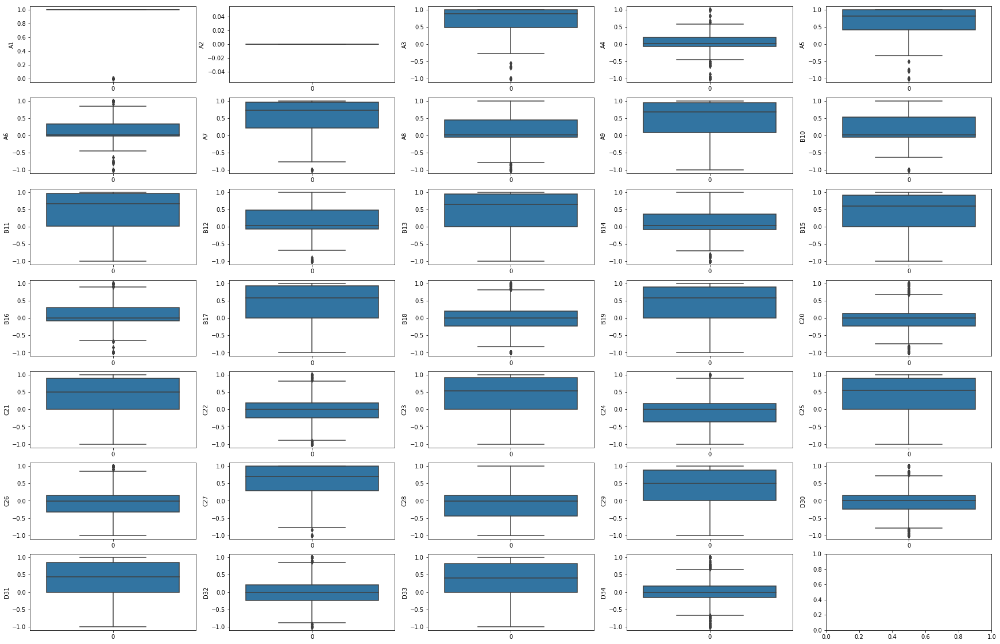

In [6]:
# univariate box and whisker plots done using seaborn
plt.figure(figsize=(30,20))
for i,column in enumerate(dataset.columns):
    try:
        plt.subplot(7,5,1+i)
        sns.boxplot(data=dataset[column], orient='v')
        plt.ylabel(column)
    except:
        pass

<p>Plotting the unicariate histograms for each attribute was more complex since Seaborn attempts to plot all histograms on a single plot, but visually the plots are easier to look at with their wider plots, and thicker outlines</p>

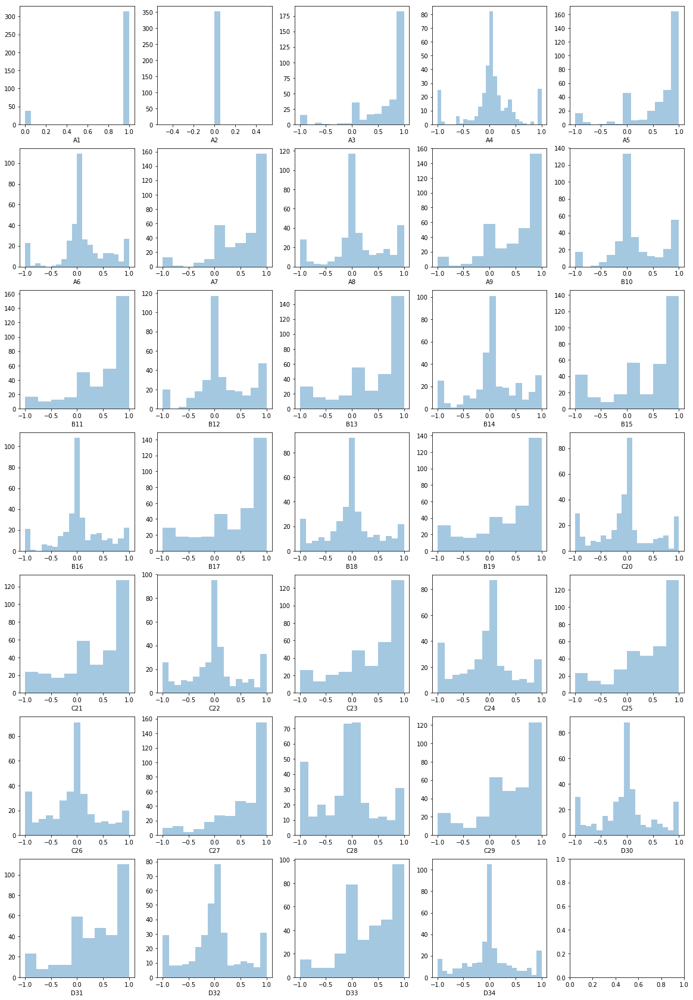

In [7]:
# histograms
plt.figure(figsize=(20,30))
for i,column in enumerate(dataset.columns):
    try:
        plt.subplot(7,5,1+i)
        sns.distplot(dataset[column], kde=False)
    except:
        pass

<p>Similar to plotting histograms, a loop was needed to plot univariate plots; in addition the plots look nice, but lack seperation between indivdual bars so outline may need to be added for some applications. Also Seaborn by default plots the histograms with the KDE line, so if that is not desired it must be explicitly stated.</p>

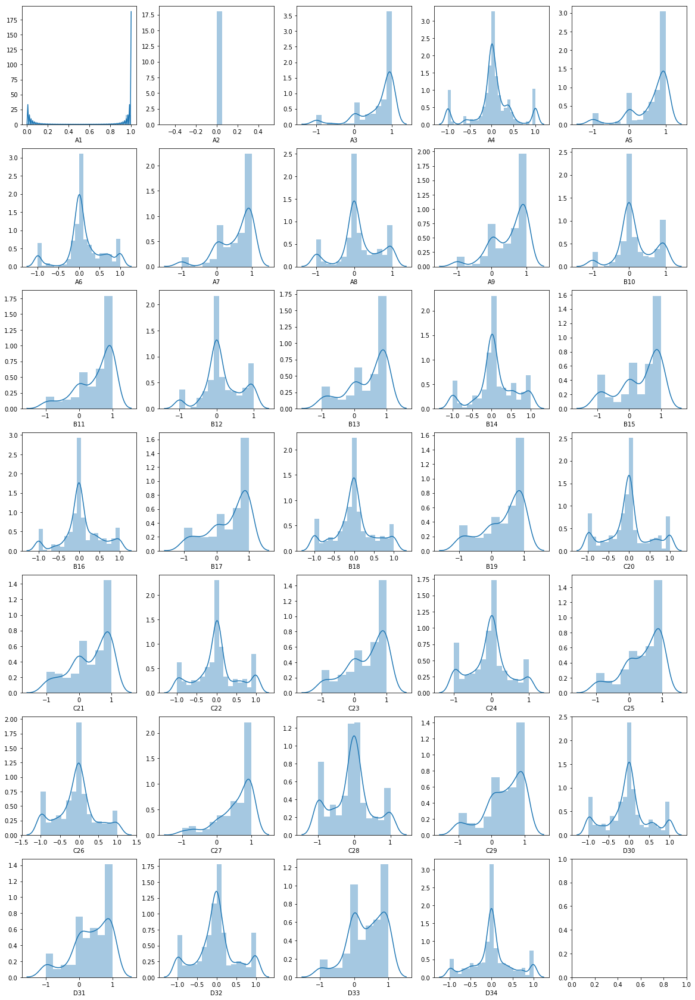

In [8]:
# plot Univariate KDE plots
plt.figure(figsize=(20,30))
for i,column in enumerate(dataset.columns):
    try:
        plt.subplot(7,5,1+i)
        sns.distplot(dataset[column])
    except:
        pass

<p>Besides needing a loop to create univariate plots, KDE is built into the distplot function, so its as simple as leaving the function to its defaults.</p>

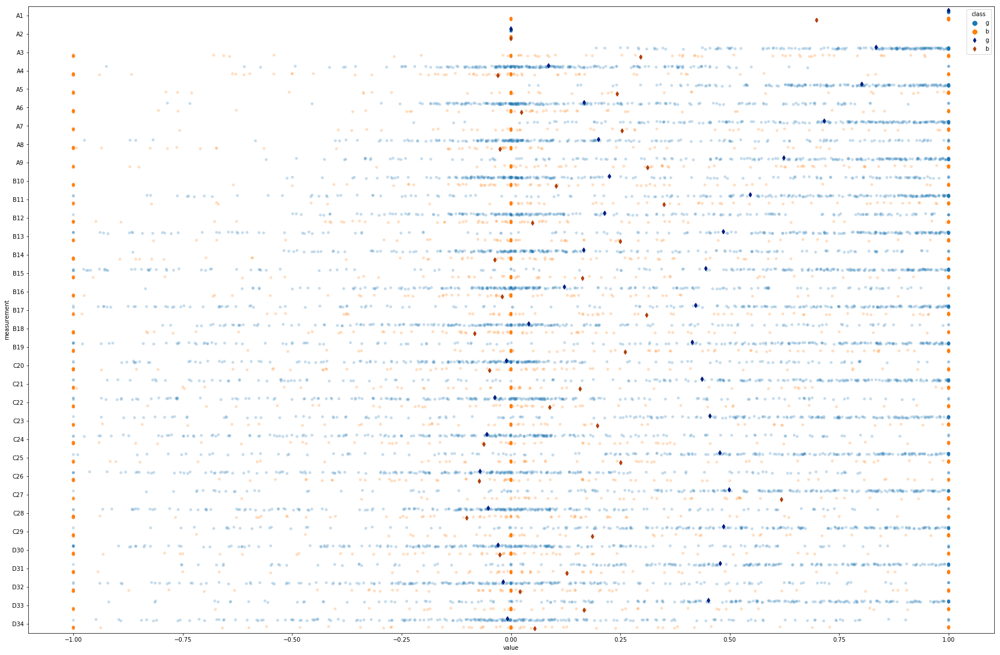

In [9]:
# "Melt" the dataset to "long-form" or "tidy" representation
melted_dataset = pd.melt(dataset, "class", var_name="measurement")
# plot a stripplot which shows the values for each attribute for each class.
# Initialize the figure
plt.figure(figsize=(30,20))
#f, ax = plt.subplots()
sns.despine(bottom=True, left=True)

# Show each observation with a scatterplot
sns.stripplot(x="value", y="measurement", hue="class",
              data=melted_dataset, dodge=True, alpha=.25, zorder=1)

# Show the conditional means
sns.pointplot(x="value", y="measurement", hue="class",
              data=melted_dataset, dodge=.532, join=False, palette="dark",
              markers="d", scale=.75, ci=None)

<p>Histograms are a great way to visualize the frequency of values for each attribute, but range of values that each attribute inhabits for each class. Seaborns pointplot allows this sort of visualization by splitting points for each class, and could be useful for finding attributes with well seperated values that could easily distinguised by classification models.</p>

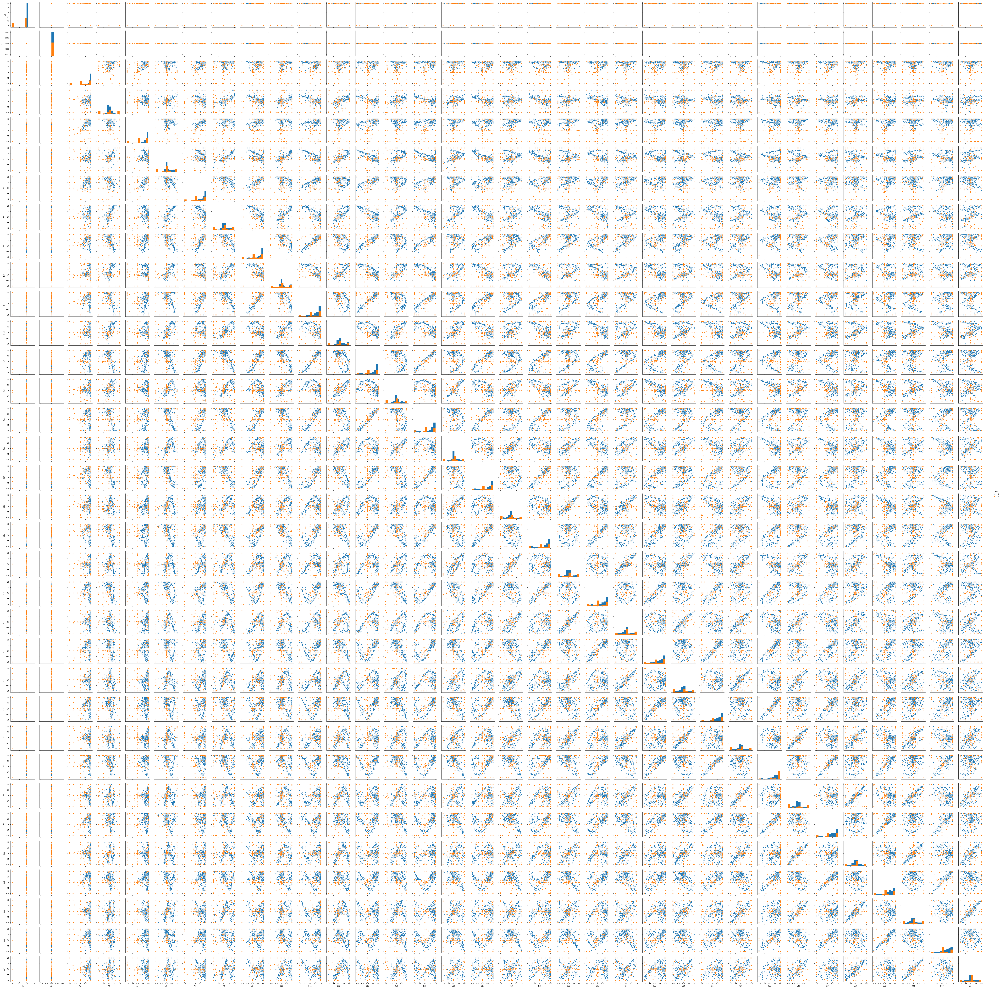

In [10]:
# scatter plot matrix
sns.pairplot(dataset, hue='class', diag_kind='hist')
plt.show()

<p>Compared to the matplotlib scatter matrix the Seaborn pairplot is much more visually appealing and the attribute points are seperately colored based on class, and similar to Seaborn's pointplot it could be useful to distinguish easily seperable attributes.</p>

<h5 style='color:blue'>Training Classification Models and Observing Differences in Performance</h5>

In [11]:
# Split-out validation dataset
array = dataset.values
X = array[:,0:34]
Y = array[:,34]
validation_size = 0.20
seed = 7
X_train, X_validation, Y_train, Y_validation = train_test_split(X, Y, test_size=validation_size, random_state=seed)

In [12]:
# Spot-Check Algorithms
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))

In [13]:
# evaluate each model in turn,store performance, and output general performance of models
results = []
model_names = []
dictionary_results = dict()
for name, model in models:
    kfold = KFold(n_splits=10, random_state=seed)
    cv_results = cross_val_score(model, X_train, Y_train, cv=kfold, scoring='accuracy')
    results.append(cv_results)
    model_names.append(name)
    dictionary_results[name] = cv_results
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.853571 (0.064780)
LDA: 0.867857 (0.061962)
KNN: 0.835714 (0.078571)
CART: 0.867857 (0.063987)
NB: 0.882143 (0.067857)
SVM: 0.925000 (0.046429)


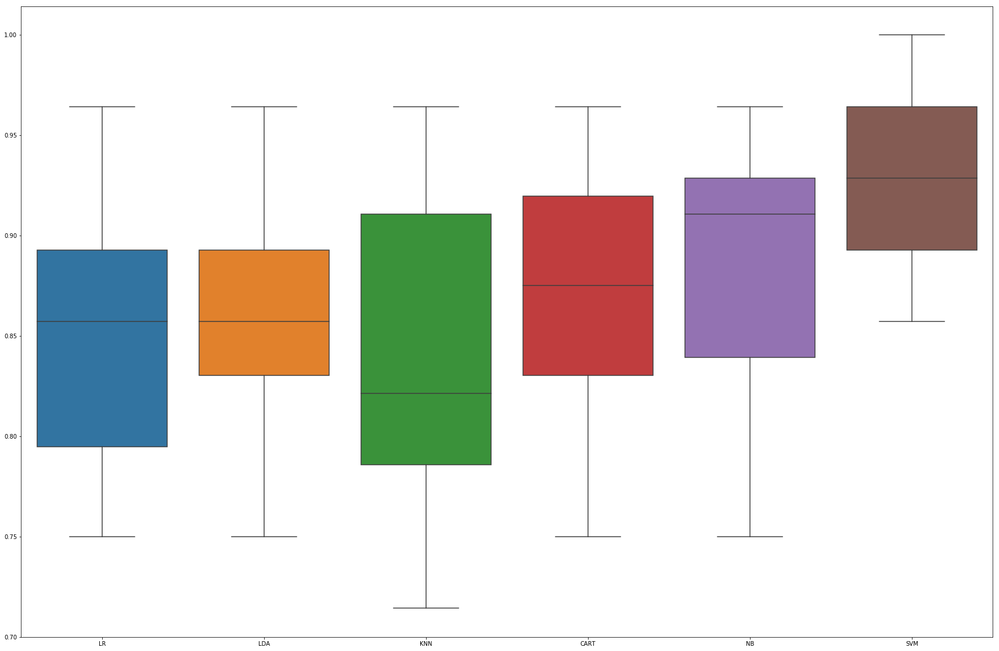

In [14]:
# Compare Algorithms
plt.figure(figsize=(30,20))
sns.boxplot(data=pd.DataFrame(dictionary_results)) # seaborn code for part 3

<p>Seaborn's combined histograms have much better color seperation that is much more complicated in Matplotlib with the need to retrieve objects of data from the plot, and manually changing the color.</p>

<h5 style='color:blue'>Listing 6: Observe Correlation of Attributes</h5> 

In [15]:
# changing the column names to remove the class column
names = names[0:-1]

# pandas corr method find the correlations score using perason's formula by default
corr = dataset.corr()

# replace values of Nan with 0 since all values in attribute 2 are 0
corr.fillna(value=0, inplace=True)

# change correlation of A2 and itself to 1.0 to follow trend
corr['A2']['A2'] = 1.0
#corr.set_value('A2', 'A2', 1.0)

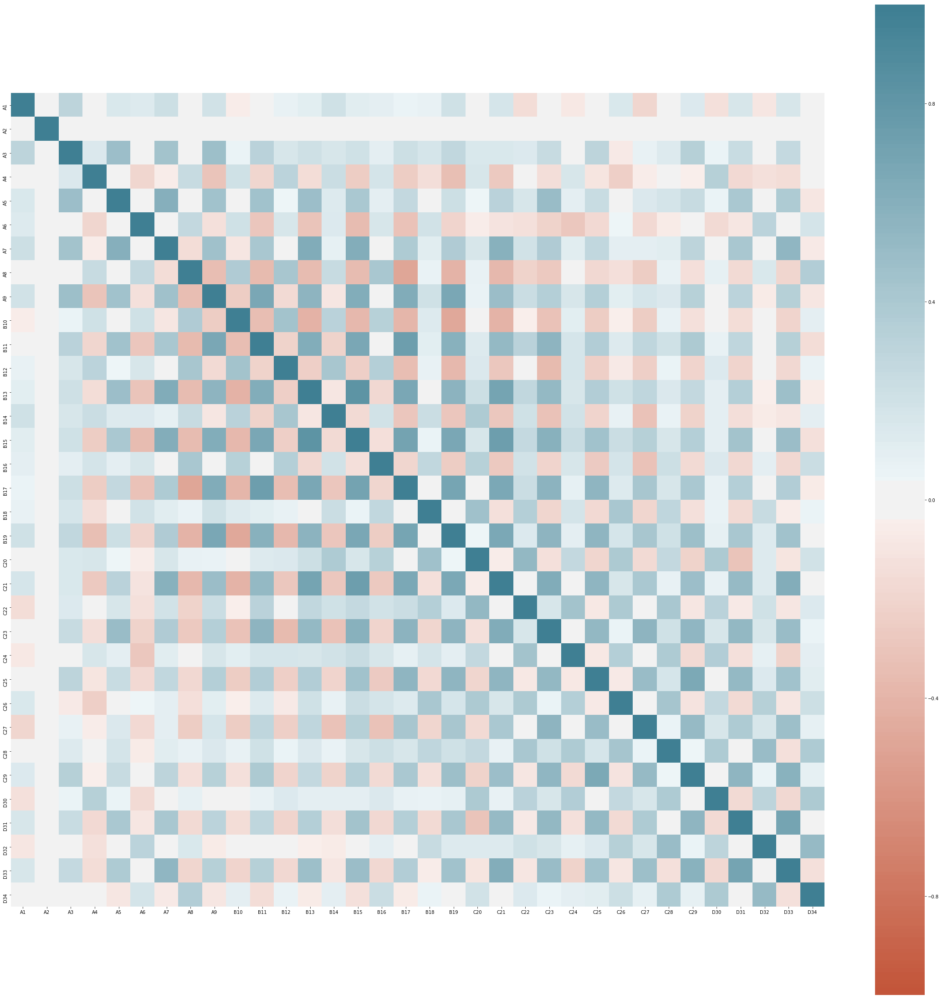

In [16]:
# seaborn code for part 3
plt.figure(figsize=(40,40))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True)

<p>Seaborn's better color defaults once again show up when creating heatmaps in which a more visually appealing distribution of colors. In addition the plot can be made square, and the colorbar is added by default without more lines of code.</p>

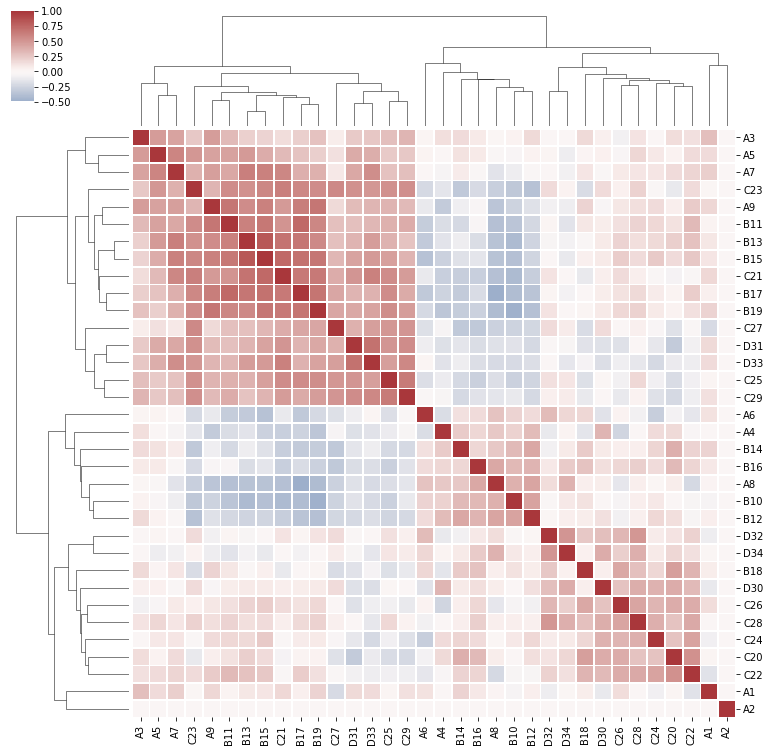

In [17]:
# plot of hierarchically-clustered heatmap
# better correlation matrix
sns.clustermap(corr, center=0, cmap="vlag",
               linewidths=.75, figsize=(13, 13))

<p>Clustermap is another complex plot like pointplot which is implemented in Seaborn which creates a heatmap which clusters attributes with high correlation with one another. This can help find attributes that have too large of a correlation to one another or attibutes that are too uncorrelated to provide significant data.</p>

<h5 style='color:blue'>Overview of Results</h5> 

<ul>
    <li>Seaborn is a plotting library that is built on top of Matplotlib, and has its own advantages and disadvantages when compared to Matplotlib.</li>
    <li>The first advantage is that it contains functions built upon matplotlib functions so much of the versatility in Matplotlib is still present in the form of overlapping parameters in functions.</li>
    <li>Another advantage is that seaborn has much better coloring defaults than Matplotlib, and even adds more color to some graphs, such as the pairplot, where points are seperately colored based on class.</li>
    <li>Another advantage of Seaborn is that it has certain functions that create complex graphs such as the clustermap which performs multiple operations for the programmer.</li>
    <li>Seaborn is also built to utilize Pandas dataframes rather than arrays like Matplotlib. Meaning that it can work on the entire dataset and all columns of data in a more concise manner.</li>
    <li>One disadvantage with Seaborn is that while it does have much of the versatility of Matplotlib, it does lose some of the original versatility due to how it is structured to use its own way of managing colors, spacing plots, etcetera.</li>
    <li>Another disadvantage of Seaborn is that the functions are made for more specific purposes making them harder to adapt to other purposes.</li>
</ul>